## Preliminaries

In [1]:
import numpy as np
import torch
import matplotlib
import matplotlib.pyplot as plt

import torchvision
from torchvision import transforms

In [2]:
data_path = "/home/sravula/experiments/datasets/8047_vel_imgs.npy"

In [3]:
from datasets.velocity_fine import Velocity

tran_transform = transforms.Compose([
    transforms.Resize([256, 256])
])

dataset = Velocity(path=data_path, transform=tran_transform)

In [4]:
N = len(dataset)
indices = list(range(N))
random_state = np.random.get_state()
np.random.seed(2240)
np.random.shuffle(indices)
np.random.set_state(random_state)
train_indices, test_indices = indices[:int(N * 0.9)], indices[int(N * 0.9):]

In [5]:
test_dataset = torch.utils.data.Subset(dataset, test_indices)

In [6]:
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=15, shuffle=False,
                         num_workers=8, drop_last=True)

test_iter = iter(test_loader)

test_sample = next(test_iter)[0]

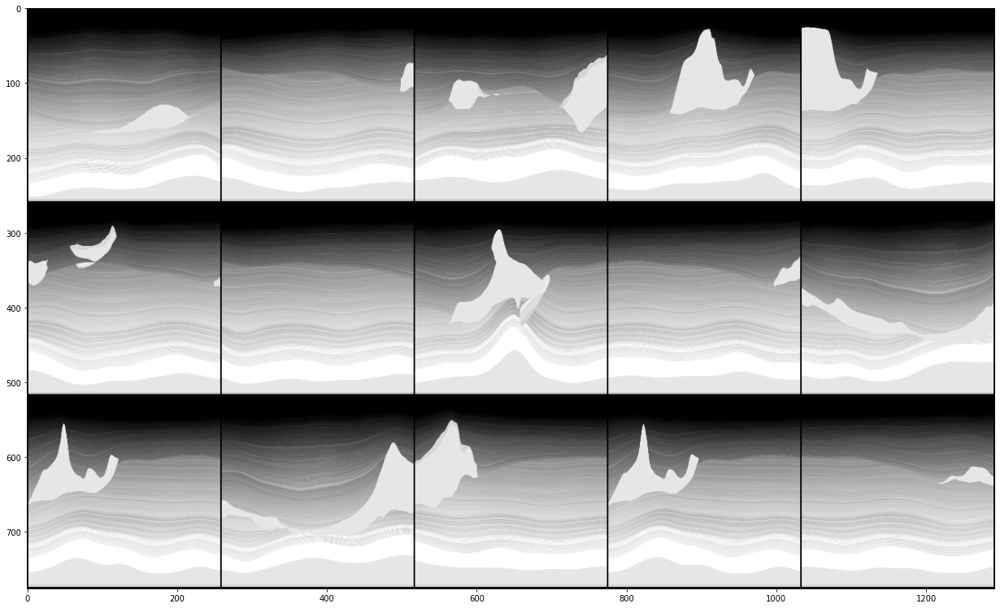

In [7]:
grid_img = torchvision.utils.make_grid(test_sample, nrow=5)

dpi = matplotlib.rcParams['figure.dpi']

height = width = 6*256
figsize = width / float(dpi), height / float(dpi)

plt.figure(figsize=figsize)
plt.imshow(grid_img.permute(1, 2, 0))
plt.show()

## Create Measurements

In [8]:
#We want y = Ax where A is a random Gaussian
#y = [N, m, 1], A = [N, m, C x W x H], x = [N, C, H, W]

N, C, H, W = test_sample.shape

m = C*H*W // 5

In [9]:
#A = (1 / np.sqrt(m)) * torch.randn(m, C*H*W)
A = torch.eye(C*H*W)[np.random.choice(a=C*H*W, size=m, replace=False).tolist()]

y = torch.matmul(A, test_sample.view(N, -1, 1))

print(A.shape)
print(y.shape)
print(test_sample.shape)

torch.Size([13107, 65536])
torch.Size([15, 13107, 1])
torch.Size([15, 1, 256, 256])


## Load the network and see the outputs with test samples

In [10]:
ckpt_path = "/home/sravula/experiments/logs/run_2/checkpoint.pth"
config_path = "/home/sravula/ncsnv2/configs/velocity.yml"

In [11]:
import argparse
from main import dict2namespace
import yaml

with open(config_path, 'r') as f:
    config = yaml.load(f)
new_config = dict2namespace(config)

device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')
new_config.device = device

print(device)

/home/sravula/venvs/ncsnv2/lib64/python3.6/site-packages/ipykernel_launcher.py:6: YAMLLoadWarning: calling yaml.load() without Loader=... is deprecated, as the default Loader is unsafe. Please read https://msg.pyyaml.org/load for full details.
  


cuda


In [12]:
from models.ncsnv2 import NCSNv2Deepest
from models.ema import EMAHelper
from models import get_sigmas

new_config.input_dim = new_config.data.image_size ** 2 * new_config.data.channels

score = NCSNv2Deepest(new_config).to(new_config.device)
score = torch.nn.DataParallel(score)

#Set up the exponential moving average
if new_config.model.ema:
    ema_helper = EMAHelper(mu=new_config.model.ema_rate)
    ema_helper.register(score)

states = torch.load(ckpt_path)
score.load_state_dict(states[0])
### Make sure we can resume with different eps
states[1]['param_groups'][0]['eps'] = new_config.optim.eps

if new_config.model.ema:
    ema_helper.load_state_dict(states[4])

#grab all L noise levels
sigmas = get_sigmas(new_config)

In [13]:
test_score = ema_helper.ema_copy(score)

test_score.eval();

In [14]:
with torch.no_grad():
    labels = torch.ones(test_sample.shape[0], device=test_sample.device) * 1099
    labels = labels.long()

    grad = test_score(test_sample, labels)
    
    prior_norm = torch.norm(grad.view(grad.shape[0], -1), dim=-1).mean()

print("Mean L2-Norm of s(x) = \grad_x log p(x) of test samples: ", prior_norm.item())

/home/sravula/venvs/ncsnv2/lib64/python3.6/site-packages/torch/nn/functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  /pytorch/c10/core/TensorImpl.h:1156.)
  return torch.max_pool2d(input, kernel_size, stride, padding, dilation, ceil_mode)


Mean L2-Norm of s(x) = \grad_x log p(x) of test samples:  10085.5751953125


## Set up and run Inverse Solver

In [15]:
from models import inverse_solver
import time

N, C, H, W = test_sample.shape
print(N, C, H, W)

y = y.to(new_config.device)

A = A.to(new_config.device)

x0 = torch.rand(N, C, H, W, device=new_config.device)

mse = torch.nn.MSELoss()
mse_start = mse(x0, test_sample.to(new_config.device))
print("Start MSE: ", mse_start.item())

start = time.time()

num_iters = 100

lr = [0.001, 0.0001]

15 1 256 256
Start MSE:  0.21201404929161072


In [16]:
all_samples = inverse_solver(x_mod = x0, 
                             y = y, 
                             A = A, 
                             scorenet = test_score, 
                             sigmas = sigmas.cpu().numpy(), 
                             lr = lr, 
                             c2=1,
                             auto_c2=True,
                             final_only=False, 
                             verbose=True, 
                             likelihood_every=1,
                             decimate_sigma=1100//num_iters,
                             mode=None, 
                             true_x=test_sample.to(new_config.device), 
                             sigma_type = 'last')

print("\nTOTAL TIME: ", time.time() - start)


 iteration: 0, sigma: 0.0100, step_size: 0.0010, prior_norm: 25533.6484, likelihood_norm: 25533.6484, grad_norm: 41434.2266                         image_norm: 139.7968, train_mse: 0.2116
true_mse: 0.1320

 iteration: 1, sigma: 0.0100, step_size: 0.0010, prior_norm: 25628.0859, likelihood_norm: 10020.7646, grad_norm: 25033.0508                         image_norm: 136.5380, train_mse: 0.0326
true_mse: 0.0940

 iteration: 2, sigma: 0.0100, step_size: 0.0010, prior_norm: 25769.0996, likelihood_norm: 8706.0547, grad_norm: 22413.6562                         image_norm: 136.4409, train_mse: 0.0246
true_mse: 0.0727

 iteration: 3, sigma: 0.0100, step_size: 0.0009, prior_norm: 24365.0391, likelihood_norm: 11002.0957, grad_norm: 16353.6006                         image_norm: 138.8735, train_mse: 0.0393
true_mse: 0.0604

 iteration: 4, sigma: 0.0100, step_size: 0.0009, prior_norm: 25027.6543, likelihood_norm: 15250.9990, grad_norm: 37128.4375                         image_norm: 145.0172, train_


 iteration: 40, sigma: 0.0100, step_size: 0.0004, prior_norm: 24105.6270, likelihood_norm: 3186.9429, grad_norm: 26471.6758                         image_norm: 173.1921, train_mse: 0.0033
true_mse: 0.0022

 iteration: 41, sigma: 0.0100, step_size: 0.0004, prior_norm: 24105.4180, likelihood_norm: 3125.8274, grad_norm: 26420.3145                         image_norm: 173.3661, train_mse: 0.0032
true_mse: 0.0022

 iteration: 42, sigma: 0.0100, step_size: 0.0004, prior_norm: 24097.9199, likelihood_norm: 3047.5371, grad_norm: 26336.6543                         image_norm: 173.5456, train_mse: 0.0030
true_mse: 0.0021

 iteration: 43, sigma: 0.0100, step_size: 0.0004, prior_norm: 24096.1094, likelihood_norm: 2994.1648, grad_norm: 26288.5625                         image_norm: 173.7008, train_mse: 0.0029
true_mse: 0.0020

 iteration: 44, sigma: 0.0100, step_size: 0.0004, prior_norm: 24086.6016, likelihood_norm: 2920.9595, grad_norm: 26205.4473                         image_norm: 173.8600, train


 iteration: 80, sigma: 0.0100, step_size: 0.0002, prior_norm: 22841.1211, likelihood_norm: 1814.8707, grad_norm: 23575.2461                         image_norm: 176.2962, train_mse: 0.0011
true_mse: 0.0013

 iteration: 81, sigma: 0.0100, step_size: 0.0002, prior_norm: 22727.3652, likelihood_norm: 1799.3733, grad_norm: 23430.9766                         image_norm: 176.3216, train_mse: 0.0011
true_mse: 0.0013

 iteration: 82, sigma: 0.0100, step_size: 0.0001, prior_norm: 22596.2246, likelihood_norm: 1789.3525, grad_norm: 23279.2812                         image_norm: 176.3473, train_mse: 0.0011
true_mse: 0.0013

 iteration: 83, sigma: 0.0100, step_size: 0.0001, prior_norm: 22458.0332, likelihood_norm: 1774.9878, grad_norm: 23111.1699                         image_norm: 176.3705, train_mse: 0.0010
true_mse: 0.0013

 iteration: 84, sigma: 0.0100, step_size: 0.0001, prior_norm: 22299.0156, likelihood_norm: 1765.6473, grad_norm: 22931.6504                         image_norm: 176.3941, train

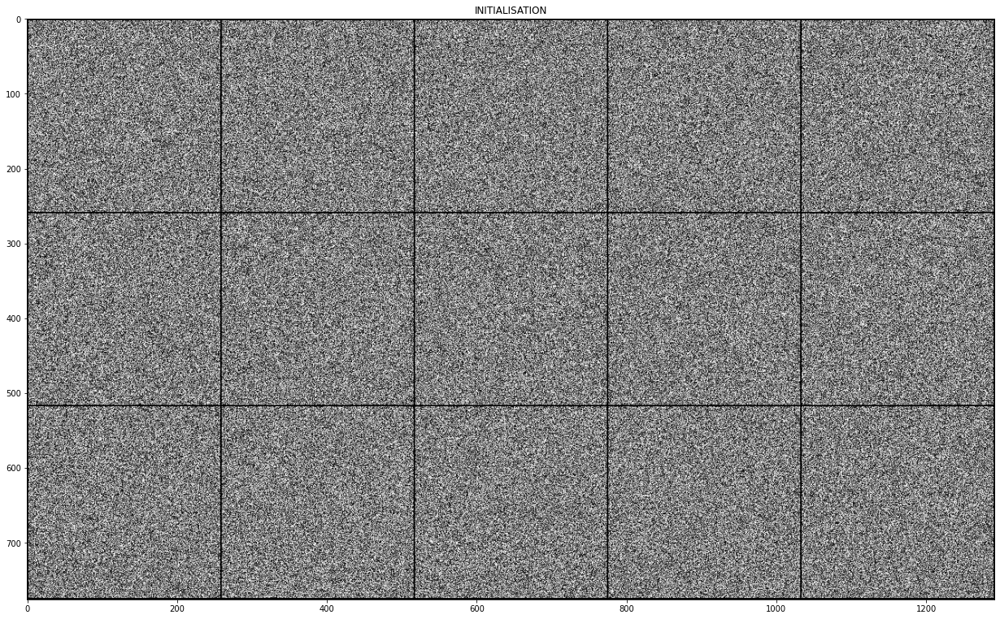

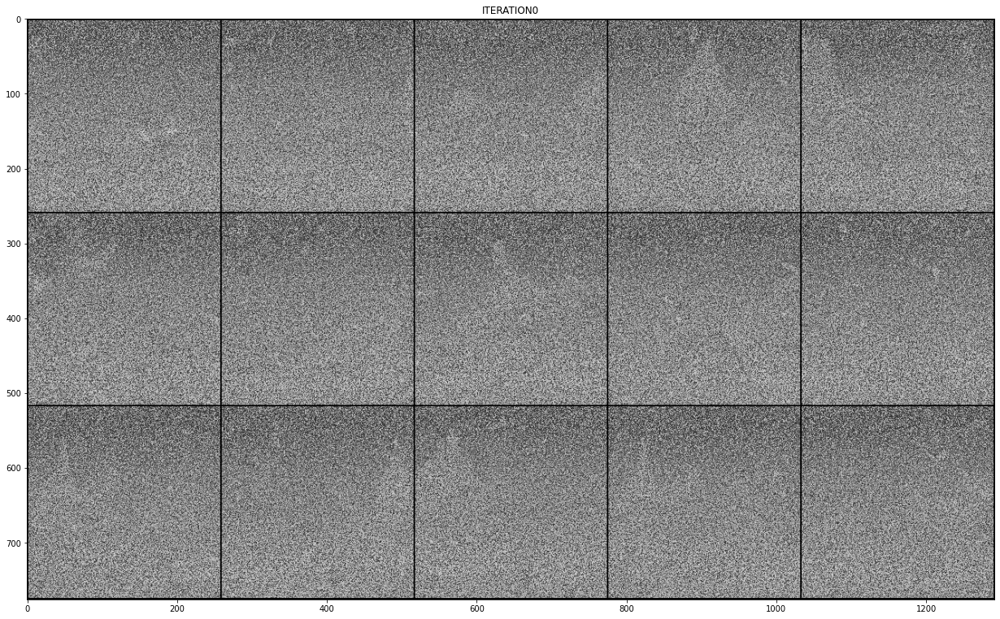

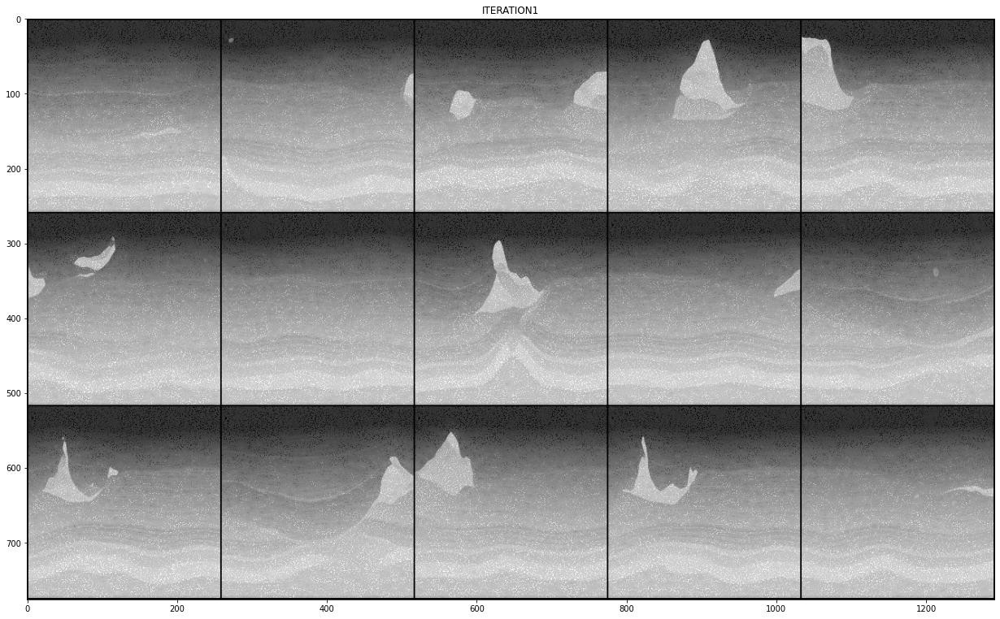

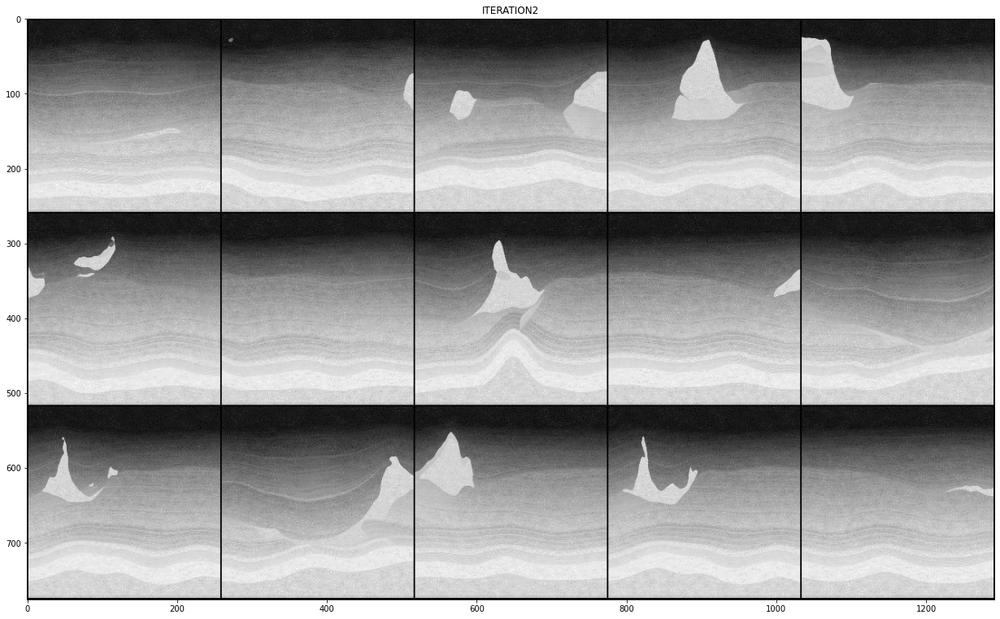

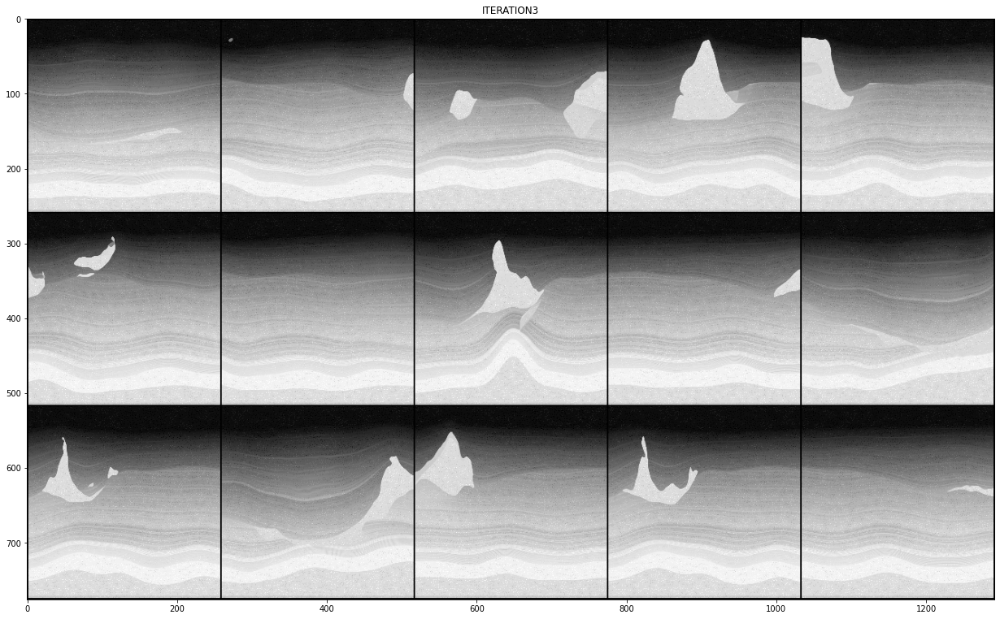

...

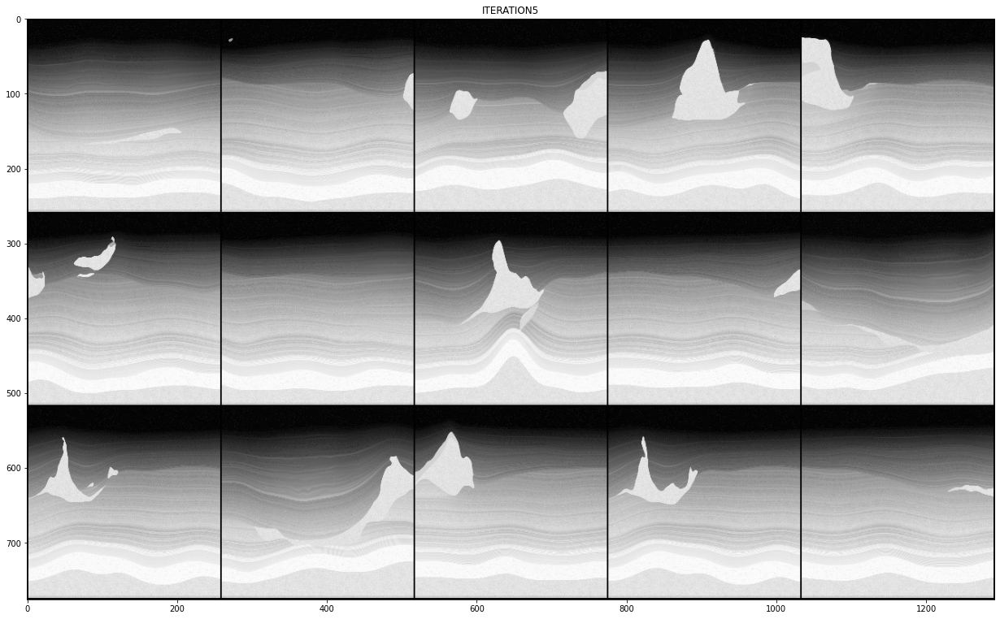

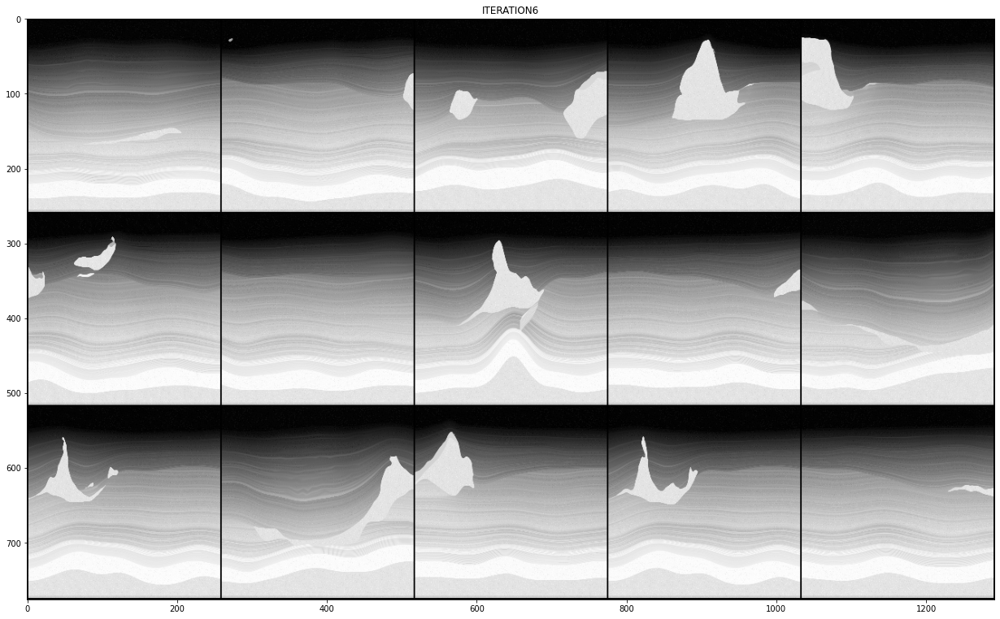

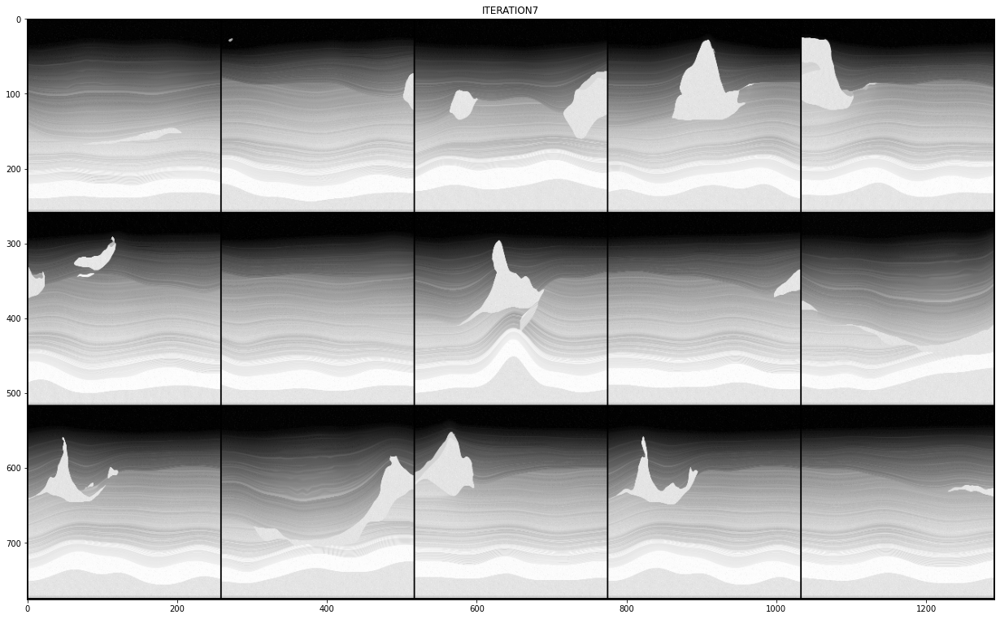

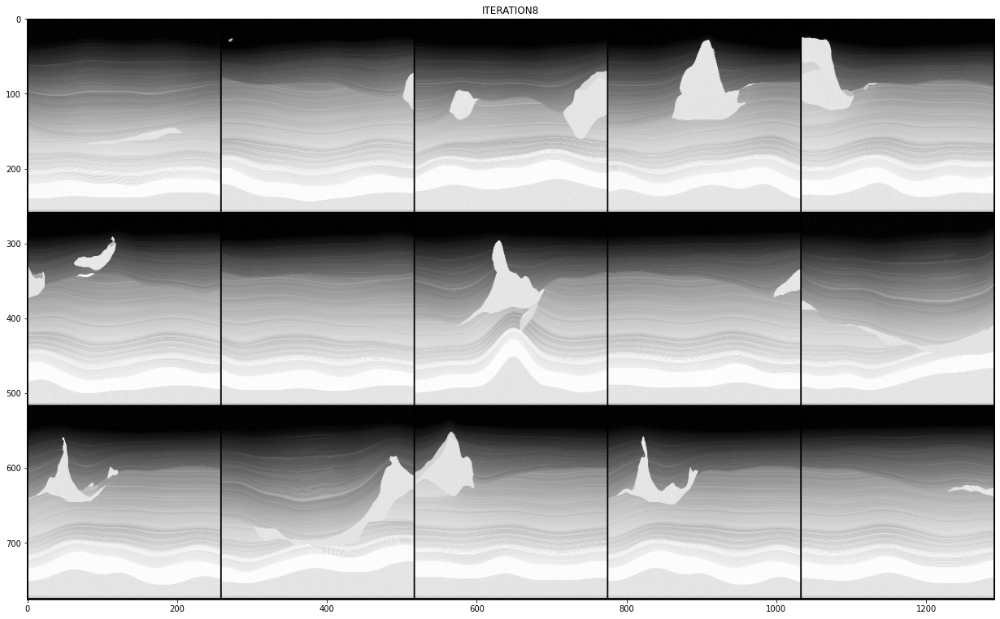

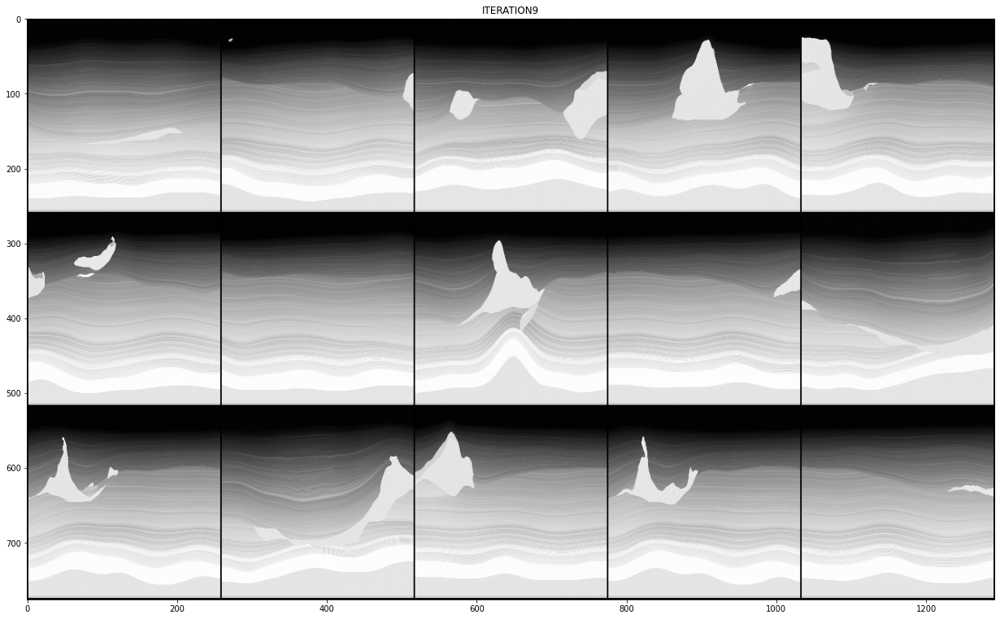

In [17]:
sample = x0.cpu()

sample = torch.clamp(sample, 0.0, 1.0)

grid_img = torchvision.utils.make_grid(sample, nrow=5)

dpi = matplotlib.rcParams['figure.dpi']

height = width = 6*256
figsize = width / float(dpi), height / float(dpi)

plt.figure(figsize=figsize)
plt.title("INITIALISATION")
plt.imshow(grid_img.permute(1, 2, 0))
plt.show()

for i in range(len(all_samples)//10):
    sample = all_samples[i*10].view(all_samples[i*10].shape[0], new_config.data.channels,
                                  new_config.data.image_size,
                                  new_config.data.image_size)

    sample = torch.clamp(sample, 0.0, 1.0)

    grid_img = torchvision.utils.make_grid(sample, nrow=5)

    dpi = matplotlib.rcParams['figure.dpi']

    height = width = 6*256
    figsize = width / float(dpi), height / float(dpi)

    plt.figure(figsize=figsize)
    plt.title("ITERATION" + str(i))
    plt.imshow(grid_img.permute(1, 2, 0))
    plt.show()